In [1]:
import os
import tensorflow as tf

In [2]:
gtPath = "_conv3/"
rgbPath = "_out/"

gtFileNames = os.listdir(gtPath)
outFileNames = os.listdir(rgbPath)

matchingFiles = set(outFileNames) & set(gtFileNames)

In [3]:
NumTrainingImages = 10000
StartingIndex = 0

import random

FileNames = random.sample(matchingFiles, NumTrainingImages)

                            
gtFileNames = gtFileNames[StartingIndex:StartingIndex+NumTrainingImages]
outFileNames = outFileNames [StartingIndex:StartingIndex+NumTrainingImages]

for i in range(0,NumTrainingImages):
    gtFileNames[i] = gtPath + FileNames[i]
    outFileNames[i] = rgbPath + FileNames[i]
    

C:\Users\danie\AppData\Local\Temp\ipykernel_19228\233777074.py:6: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  FileNames = random.sample(matchingFiles, NumTrainingImages)


In [4]:
len(gtFileNames)

10000

In [5]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(outFileNames, gtFileNames, test_size=0.2, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1) # 0.25 x 0.8 = 0.2

In [6]:
def loadImage(outPath, gtPath):
    
    img = tf.io.read_file(outPath)
    img = tf.image.decode_png(img, channels=3)
    img = tf.cast(img, tf.float32) / 255.0
    img = img[:1000, :, :] # Crop the bonnet
    img = tf.image.resize(img, (256, 256), method='nearest')

    mask = tf.io.read_file(gtPath)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.cast(mask, tf.float32) / 255.0
    mask = mask[:1000, :, :] # Crop the bonnet
    mask = tf.image.resize(mask, (256, 256), method='nearest')
    
    return img, mask

In [7]:
batchSize = 32
bufferSize = 500

def genDataset(outPath, gtPath, bufferSize, batchSize):
    
    imageList = tf.constant(outPath) 
    maskList = tf.constant(gtPath)
    dataset = tf.data.Dataset.from_tensor_slices((imageList, maskList))
    dataset = dataset.map(loadImage, num_parallel_calls=tf.data.AUTOTUNE)
    
    dataset = dataset.cache().shuffle(bufferSize).batch(batchSize)
    
    return dataset

In [8]:
trainDataset = genDataset(X_train, y_train, bufferSize, batchSize)
valDataset = genDataset(X_val, y_val, bufferSize, batchSize)
testDataset = genDataset(X_test, y_test, bufferSize, batchSize)

In [9]:
import numpy as np
import random
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

import tensorflow as tf 
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Activation, Input, Conv2D, MaxPooling2D, BatchNormalization, Conv2DTranspose, concatenate
from tensorflow.keras.models import Model, load_model
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [10]:
from tensorflow.keras import layers, models, activations, initializers, applications
from tensorflow.keras.layers import BatchNormalization, Activation, Concatenate, Conv2D, AveragePooling2D, UpSampling2D

def convBlock(block_input, num_filters=256, kernel_size=3, dilation_rate=1, padding="same", use_bias=False):
    x = Conv2D(
        num_filters,
        kernel_size=kernel_size,
        dilation_rate=dilation_rate,
        padding=padding,
        use_bias=use_bias,
        kernel_initializer=initializers.HeNormal(),
    )(block_input)
    x = BatchNormalization()(x)
    x = Activation(activations.relu)(x)
    
    return x



In [11]:

def DilatedPyramidPooling(dspp_input):
    dims = dspp_input.shape
    x = AveragePooling2D(pool_size=(dims[-3], dims[-2]))(dspp_input)
    x = convBlock(x, kernel_size=1, use_bias=True)
    out_pool = UpSampling2D(
        size=(dims[-3] // x.shape[1], dims[-2] // x.shape[2]), interpolation="bilinear",
    )(x)

    out_1 = convBlock(dspp_input, kernel_size=1, dilation_rate=1)
    out_6 = convBlock(dspp_input, kernel_size=3, dilation_rate=6)
    out_12 = convBlock(dspp_input, kernel_size=3, dilation_rate=12)
    out_18 = convBlock(dspp_input, kernel_size=3, dilation_rate=18)

    x = Concatenate(axis=-1)([out_pool, out_1, out_6, out_12, out_18])
    output = convBlock(x, kernel_size=1)
    return output


In [1]:
def DeepLab(image_shape, num_classes):
    model_input = tf.keras.Input(shape=image_shape)
    resnet50 = applications.ResNet50(
        weights="imagenet", include_top=False, input_tensor=model_input
    )
    x = resnet50.get_layer("conv4_block6_2_relu").output
    x = DilatedPyramidPooling(x)

    input_a = UpSampling2D(
        size=(image_shape[0] // 4 // x.shape[1], image_shape[1] // 4 // x.shape[2]),
        interpolation="bilinear",
    )(x)
    input_b = resnet50.get_layer("conv2_block3_2_relu").output
    input_b = convBlock(input_b, num_filters=48, kernel_size=1)

    x = Concatenate(axis=-1)([input_a, input_b])
    x = convBlock(x)
    x = convBlock(x)
    x = UpSampling2D(
        size=(image_shape[0] // x.shape[1], image_shape[1] // x.shape[2]),
        interpolation="bilinear",
    )(x)
    model_output = Conv2D(num_classes, kernel_size=(1, 1), padding="same")(x)
    model = models.Model(inputs=model_input, outputs=model_output)
    
    return model

In [13]:
img_height = 256
img_width = 256
num_channels = 3
imgShape = (256,256,3)
filters = 32
n_classes = 32

model = DeepLab(imgShape, num_classes=n_classes)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [14]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
callback = EarlyStopping(monitor='val_accuracy', patience=20, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy',factor=1e-1, patience=5, verbose=1, min_lr = 2e-6)
batch_size = 32
epochs = 30

In [15]:
history = model.fit(trainDataset, 
                    validation_data = valDataset, 
                    epochs = epochs, 
                    verbose=1, 
                    callbacks = [callback, reduce_lr], 
                    batch_size = batch_size, 
                    shuffle = True)

Epoch 1/30
188/188 [==============================] - 218s 1s/step - loss: 0.2375 - accuracy: 0.9595 - val_loss: 4.4629 - val_accuracy: 0.0202 - lr: 0.0010
Epoch 2/30
188/188 [==============================] - 124s 659ms/step - loss: 0.1032 - accuracy: 0.9597 - val_loss: 0.4865 - val_accuracy: 0.9693 - lr: 0.0010
Epoch 3/30
188/188 [==============================] - 124s 660ms/step - loss: 0.0857 - accuracy: 0.9683 - val_loss: 0.4798 - val_accuracy: 0.9693 - lr: 0.0010
Epoch 4/30
188/188 [==============================] - 124s 662ms/step - loss: 0.0818 - accuracy: 0.9785 - val_loss: 0.4698 - val_accuracy: 0.9694 - lr: 0.0010
Epoch 5/30
188/188 [==============================] - 124s 660ms/step - loss: 0.0559 - accuracy: 0.9845 - val_loss: 0.3223 - val_accuracy: 0.9743 - lr: 0.0010
Epoch 6/30
188/188 [==============================] - 124s 660ms/step - loss: 0.0400 - accuracy: 0.9873 - val_loss: 0.3455 - val_accuracy: 0.9668 - lr: 0.0010
Epoch 7/30
188/188 [=============================

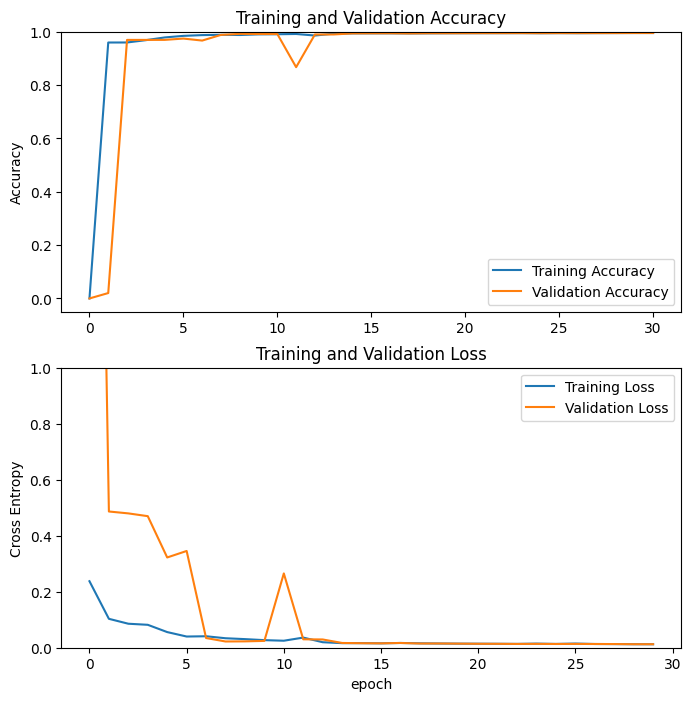

In [16]:
acc = [0.] + history.history['accuracy']
val_acc = [0.] + history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [17]:
train_loss, train_accuracy = model.evaluate(trainDataset, batch_size = 32)
validation_loss, validation_accuracy = model.evaluate(valDataset, batch_size = 32)
test_loss, test_accuracy = model.evaluate(testDataset, batch_size = 32)

63/63 [==============================] - 30s 394ms/step - loss: 0.0124 - accuracy: 0.9951


In [18]:
import tensorflow as tf

if 'model' not in globals():
    model = tf.keras.models.load_model('DeepLab.h5')


else:
    model.save('DeepLab.h5')



In [19]:
train_loss, train_accuracy = model.evaluate(trainDataset, batch_size = 32)
validation_loss, validation_accuracy = model.evaluate(valDataset, batch_size = 32)
test_loss, test_accuracy = model.evaluate(testDataset, batch_size = 32)

print(f'modelUnet Accuracy on the Training Dataset: {round(train_accuracy * 100, 2)}%')
print(f'modelUnet Accuracy on the Validation Dataset: {round(validation_accuracy * 100, 2)}%')
print(f'modelUnet Accuracy on the Test Dataset: {round(test_accuracy * 100, 2)}%')

63/63 [==============================] - 12s 185ms/step - loss: 0.0124 - accuracy: 0.9951
modelUnet Accuracy on the Training Dataset: 99.52%
modelUnet Accuracy on the Validation Dataset: 99.53%
modelUnet Accuracy on the Test Dataset: 99.51%


In [20]:
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

In [21]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]


1/1 [==============================] - 1s 666ms/step


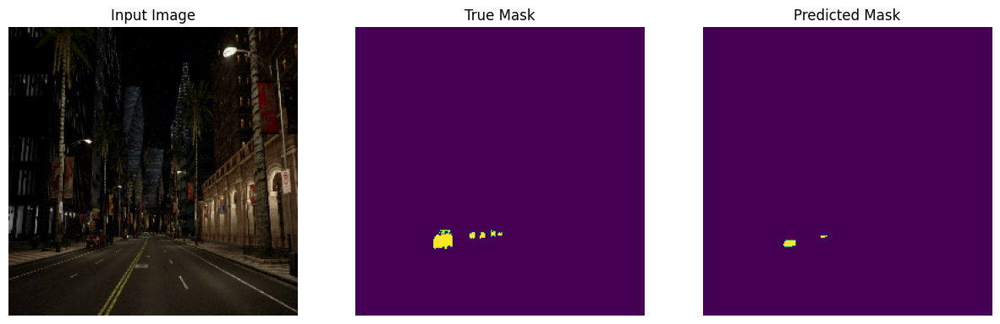

1/1 [==============================] - 0s 30ms/step


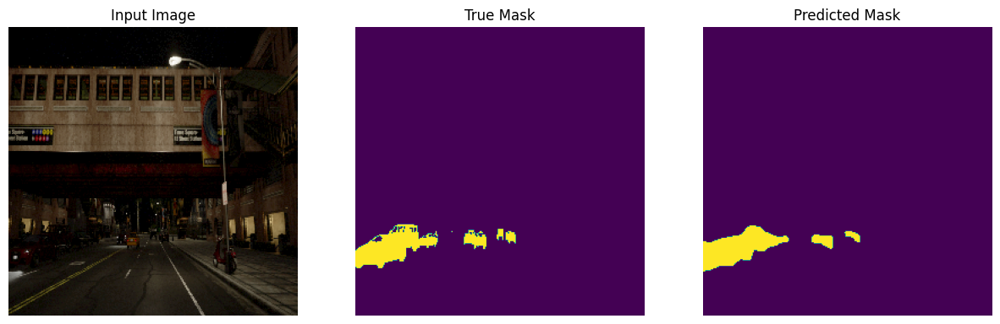

1/1 [==============================] - 0s 24ms/step


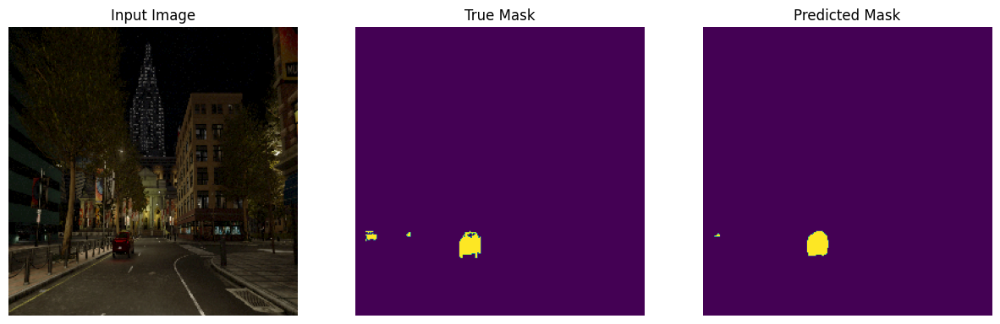

1/1 [==============================] - 0s 33ms/step


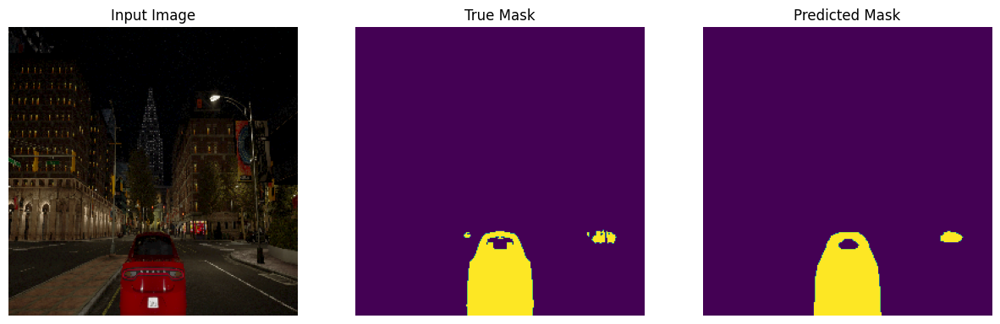

1/1 [==============================] - 0s 24ms/step


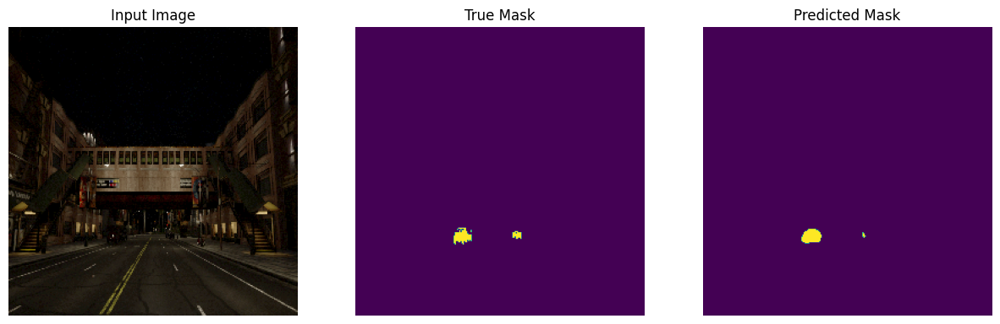

1/1 [==============================] - 0s 31ms/step


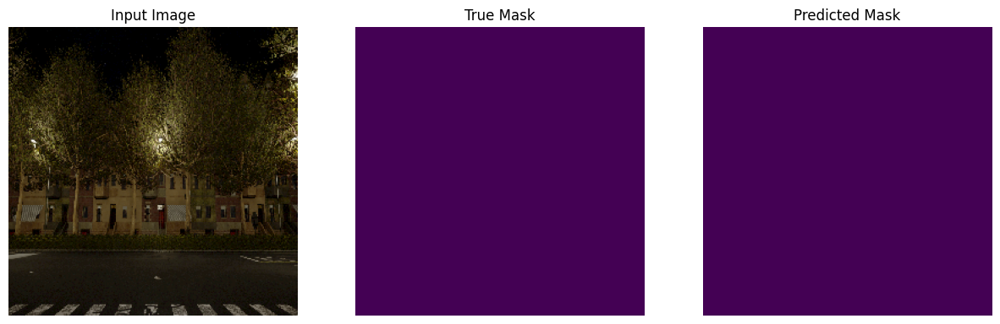

1/1 [==============================] - 0s 24ms/step


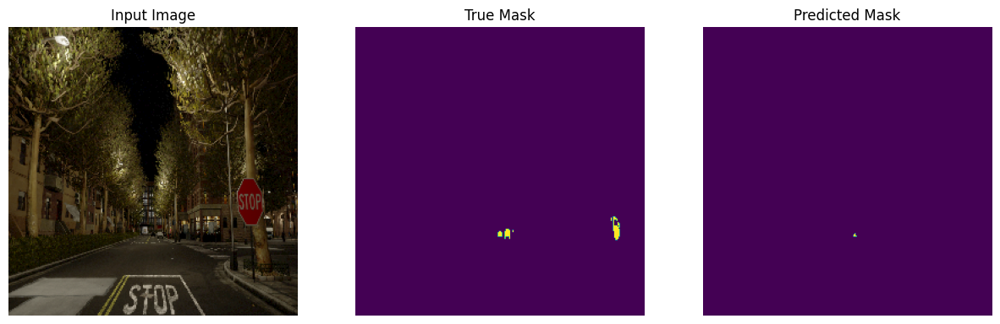

1/1 [==============================] - 0s 45ms/step


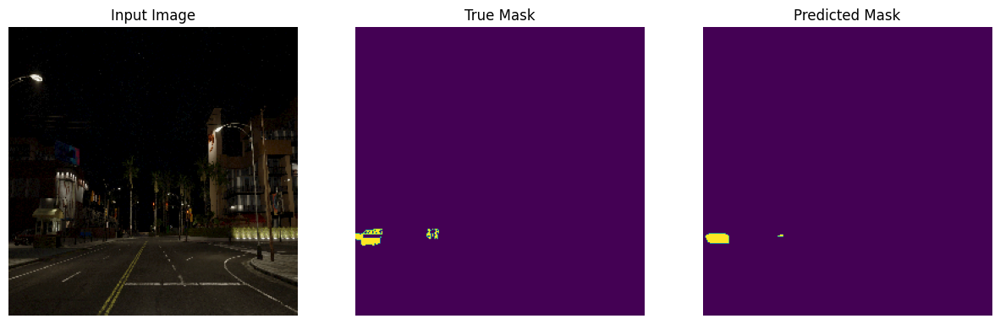

1/1 [==============================] - 0s 24ms/step


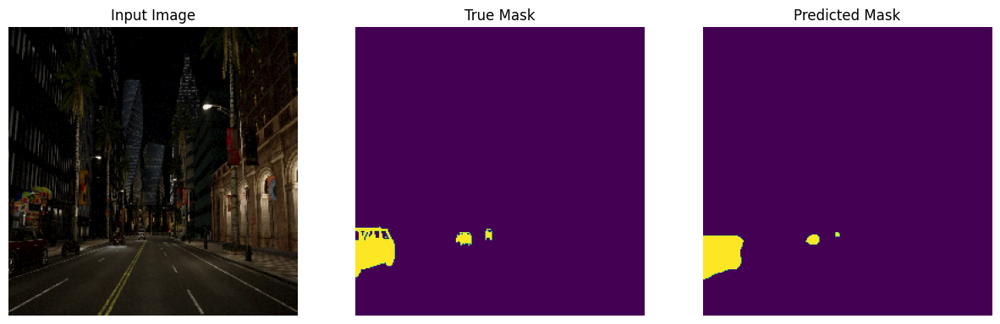

1/1 [==============================] - 0s 31ms/step


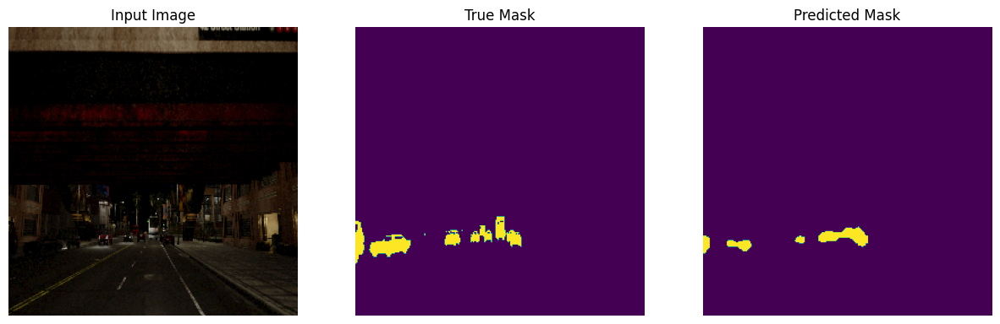

1/1 [==============================] - 0s 25ms/step


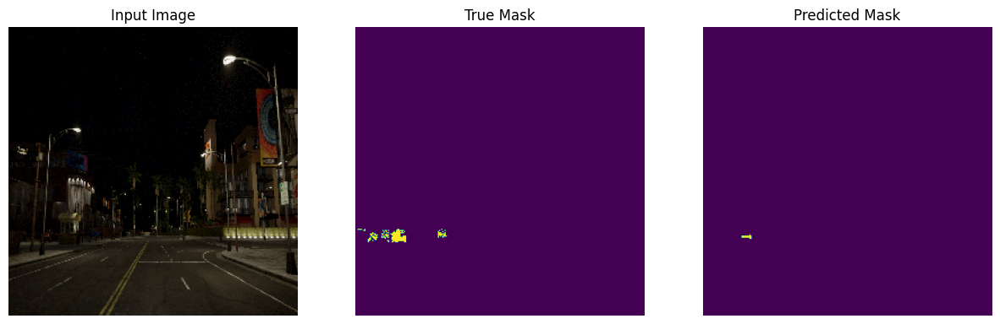

1/1 [==============================] - 0s 30ms/step


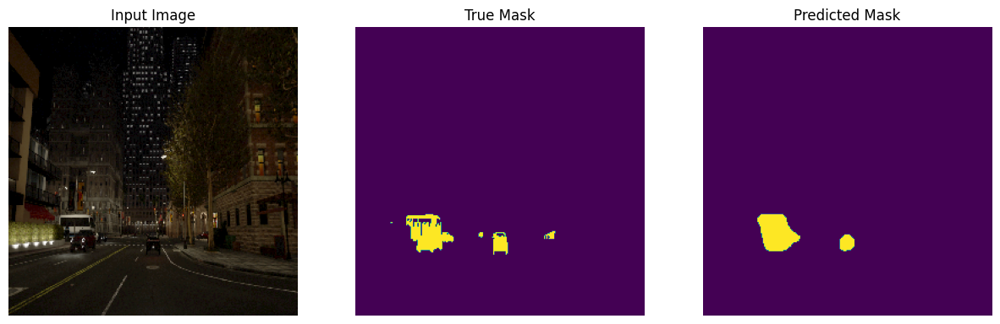

1/1 [==============================] - 0s 24ms/step


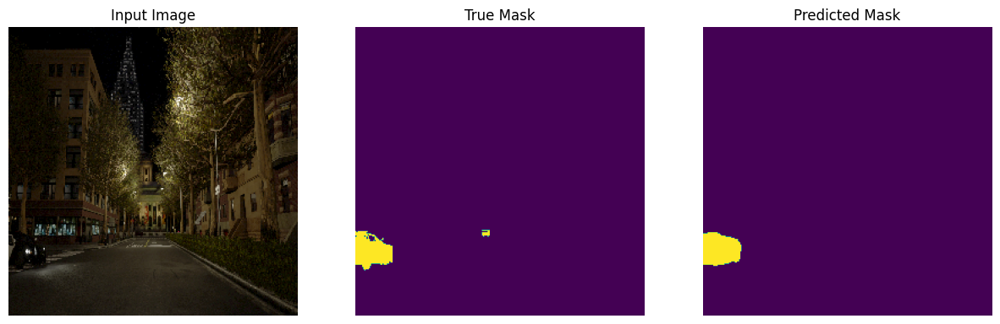

1/1 [==============================] - 0s 31ms/step


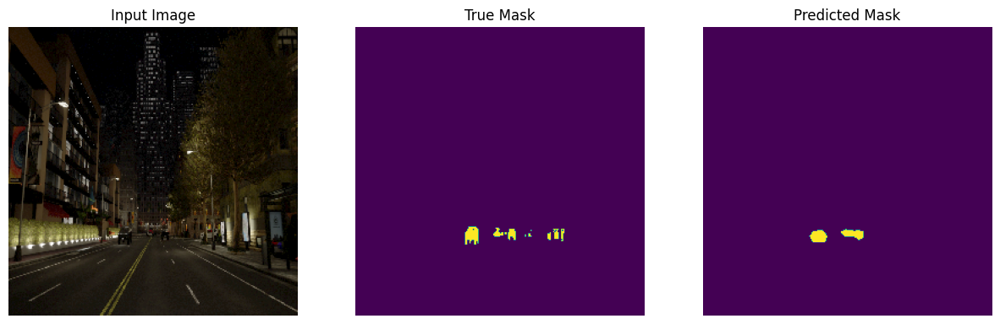

1/1 [==============================] - 0s 24ms/step


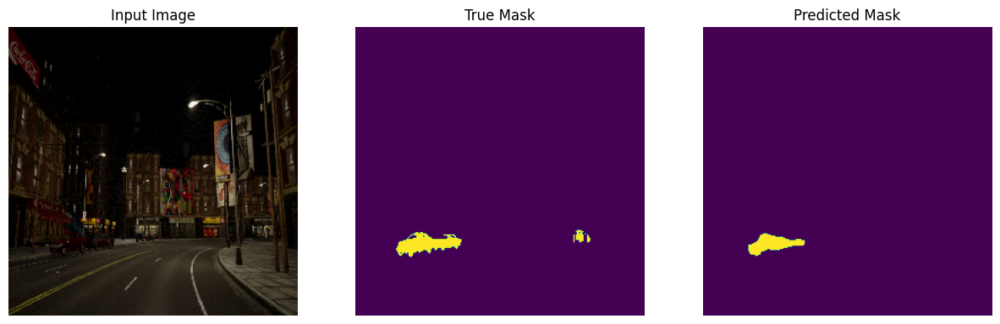

1/1 [==============================] - 0s 39ms/step


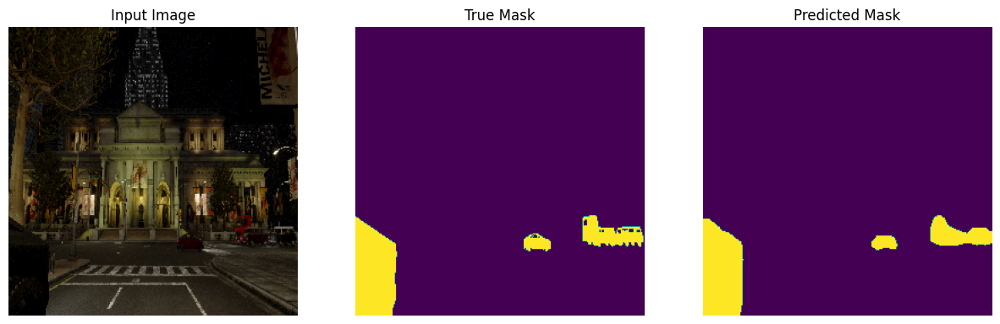

1/1 [==============================] - 0s 25ms/step


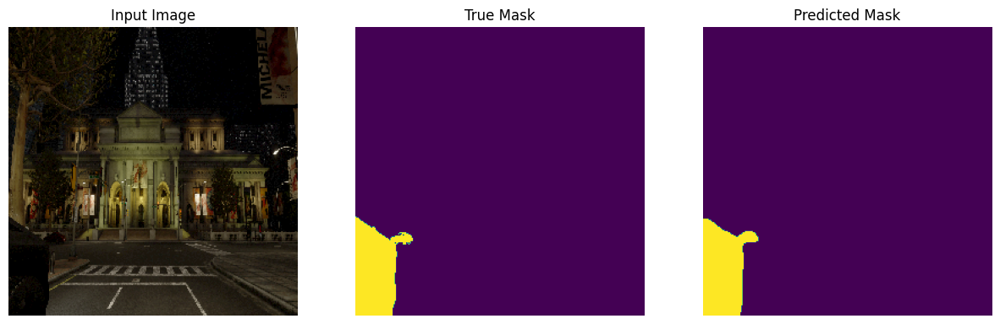

1/1 [==============================] - 0s 24ms/step


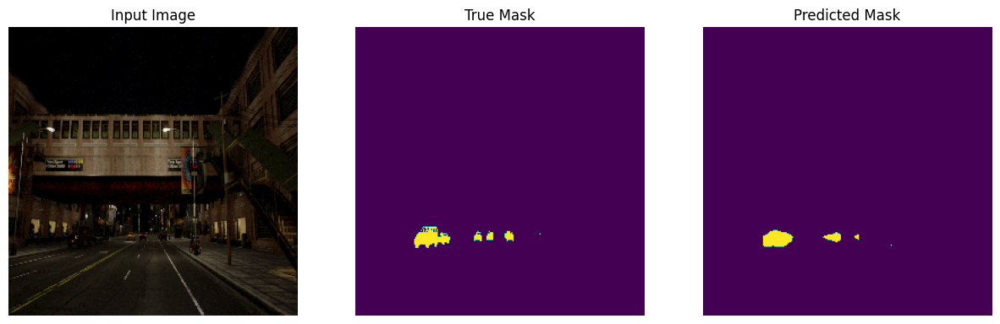

1/1 [==============================] - 0s 24ms/step


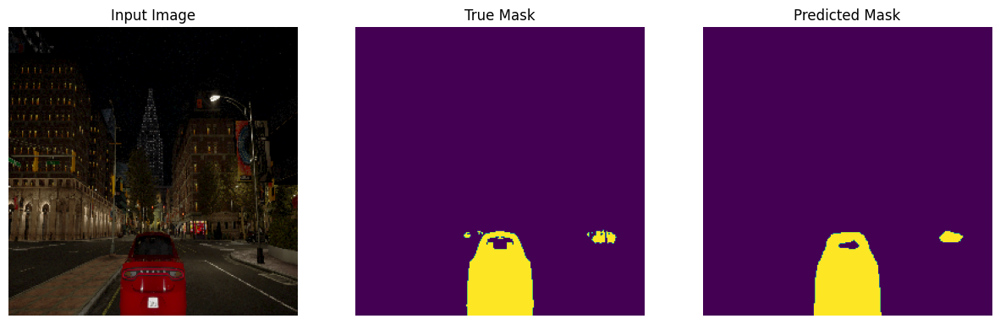

1/1 [==============================] - 0s 31ms/step


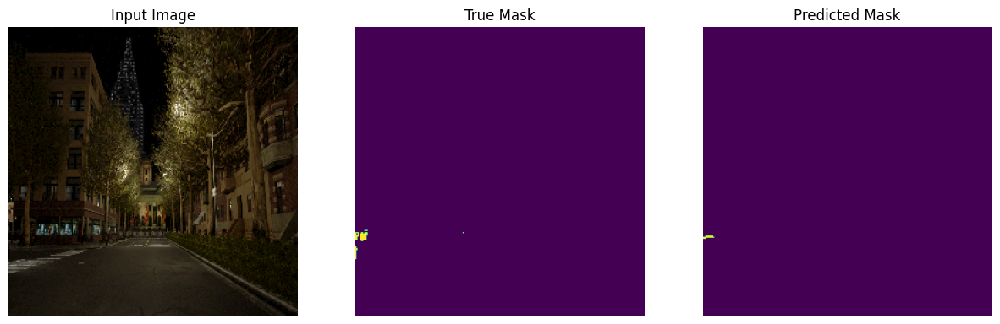

1/1 [==============================] - 0s 24ms/step


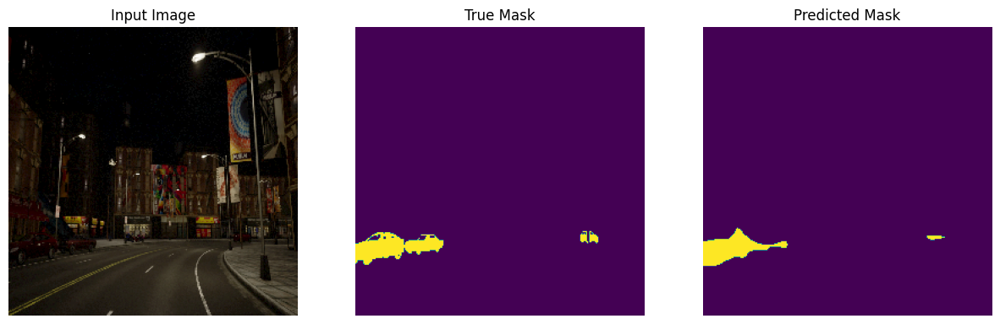

1/1 [==============================] - 0s 24ms/step


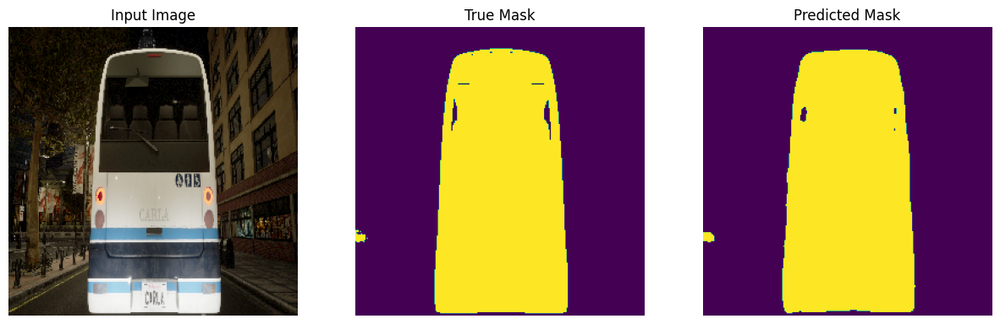

1/1 [==============================] - 0s 24ms/step


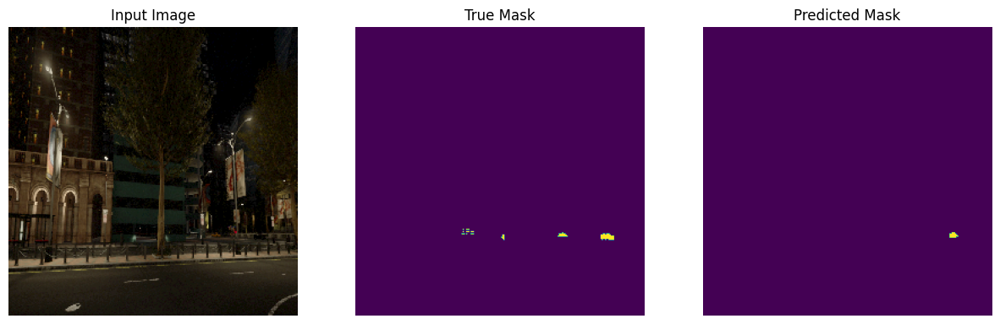

1/1 [==============================] - 0s 23ms/step


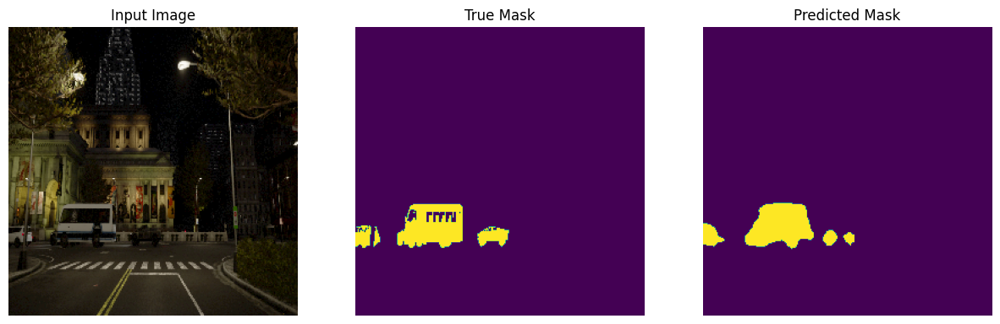

1/1 [==============================] - 0s 24ms/step


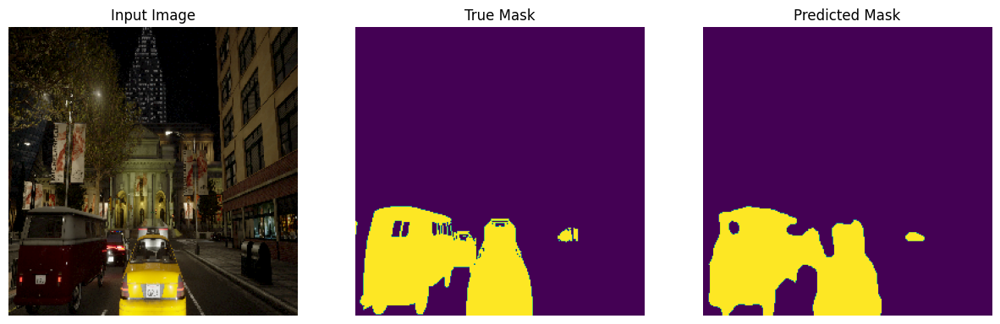

1/1 [==============================] - 0s 24ms/step


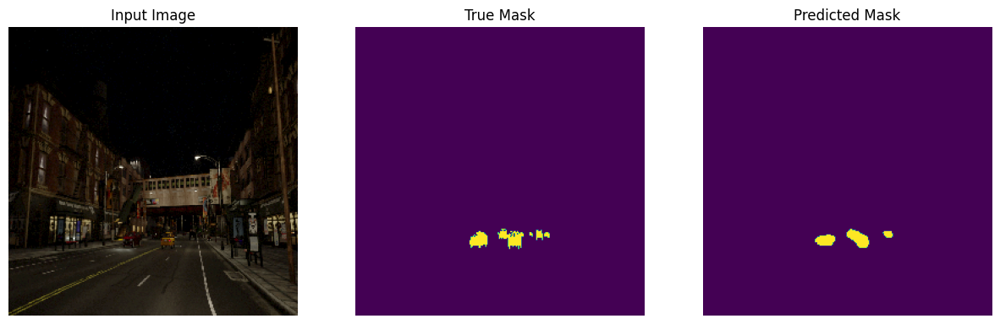

1/1 [==============================] - 0s 24ms/step


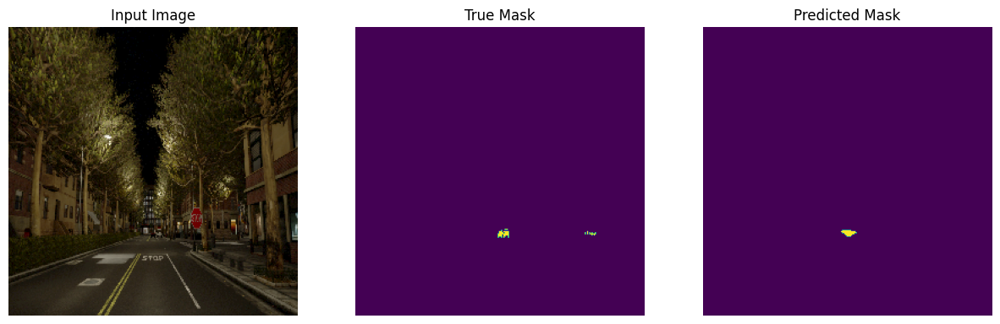

1/1 [==============================] - 0s 24ms/step


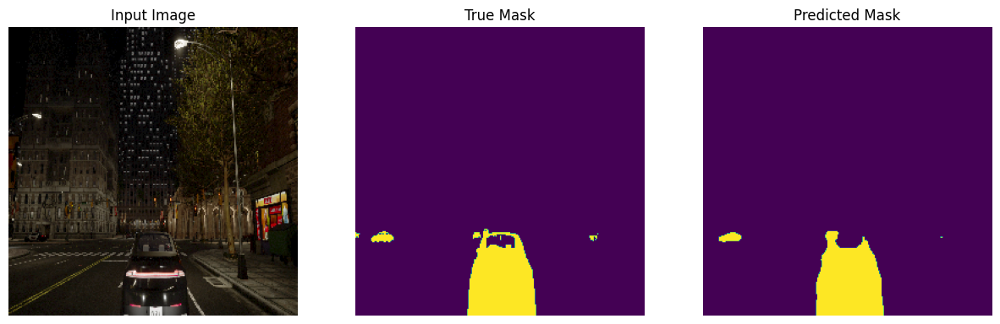

1/1 [==============================] - 0s 24ms/step


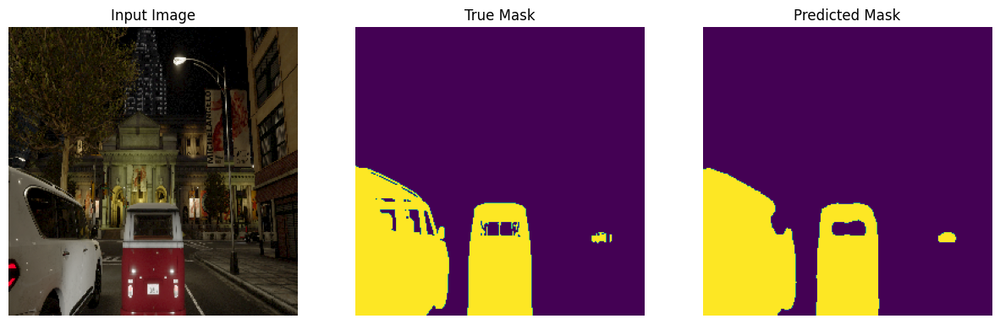

1/1 [==============================] - 0s 24ms/step


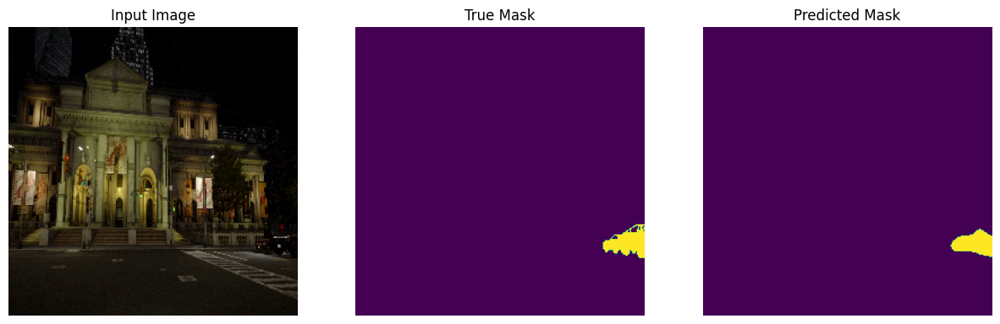

1/1 [==============================] - 0s 40ms/step


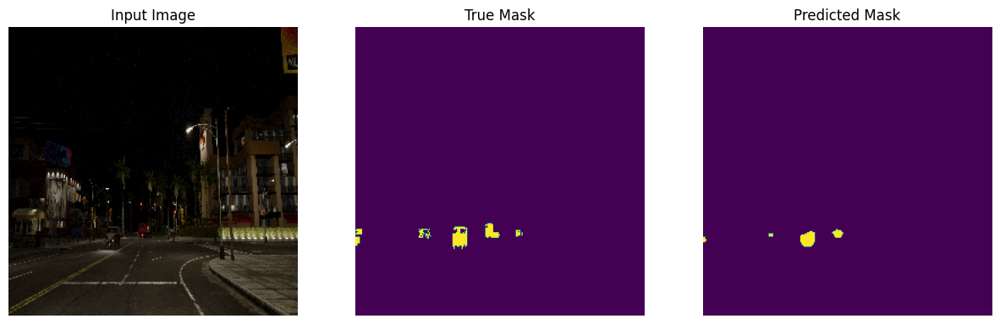

1/1 [==============================] - 0s 24ms/step


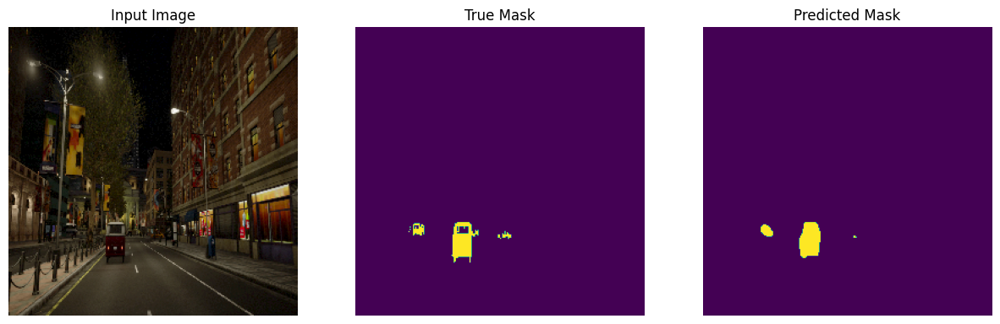

1/1 [==============================] - 0s 24ms/step


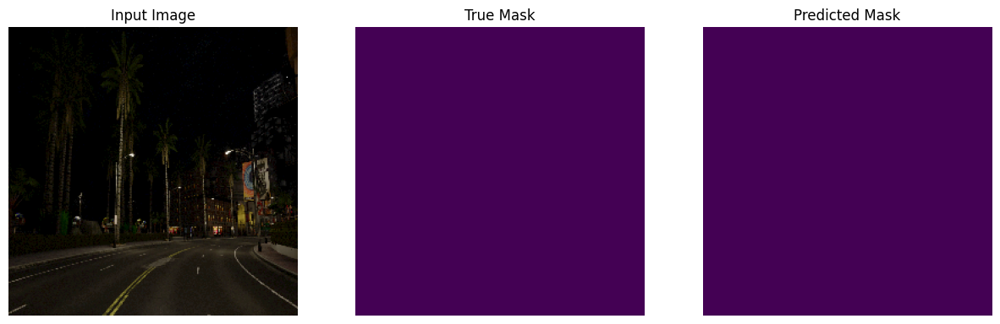

1/1 [==============================] - 0s 24ms/step


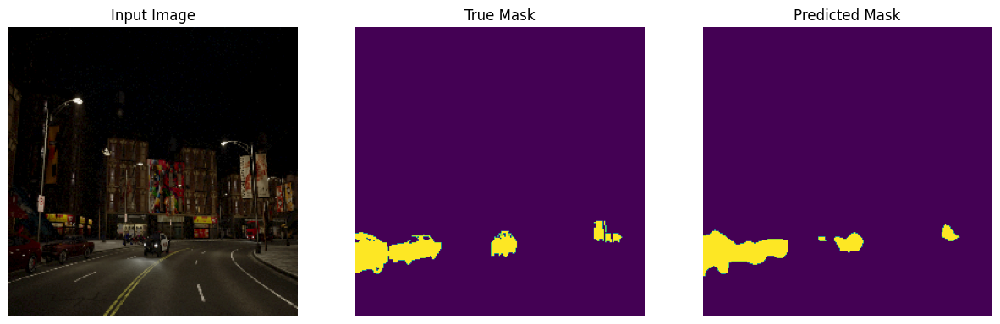

1/1 [==============================] - 0s 24ms/step


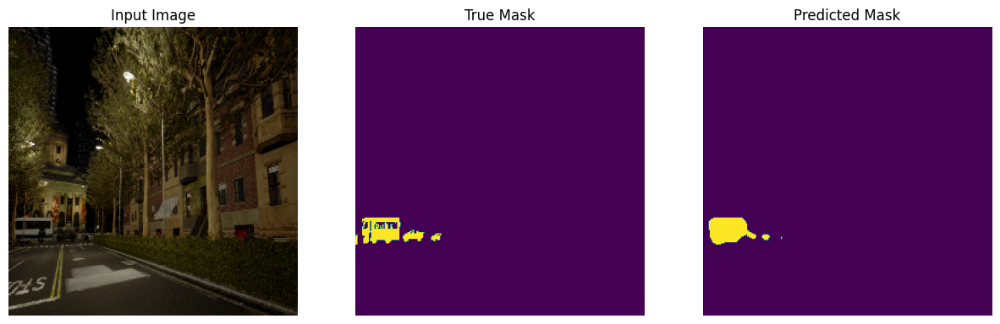

1/1 [==============================] - 0s 25ms/step


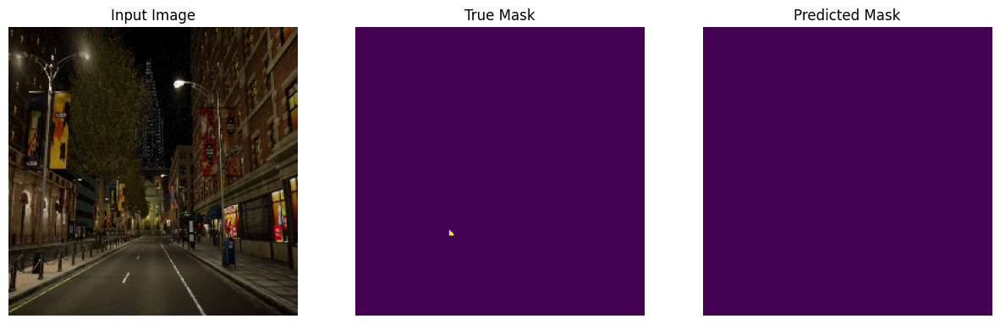

1/1 [==============================] - 0s 24ms/step


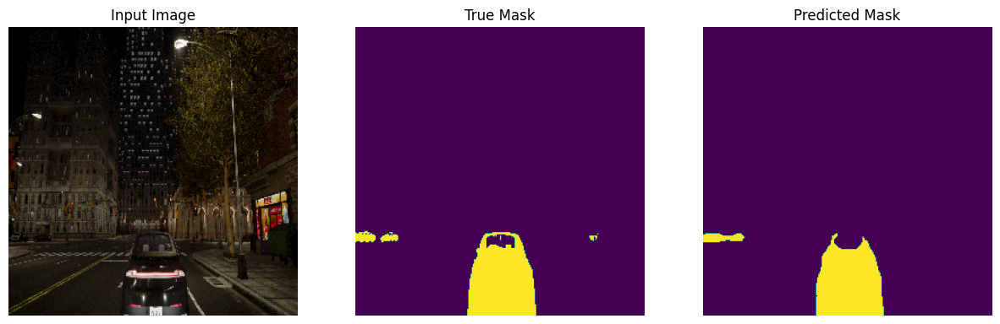

1/1 [==============================] - 0s 24ms/step


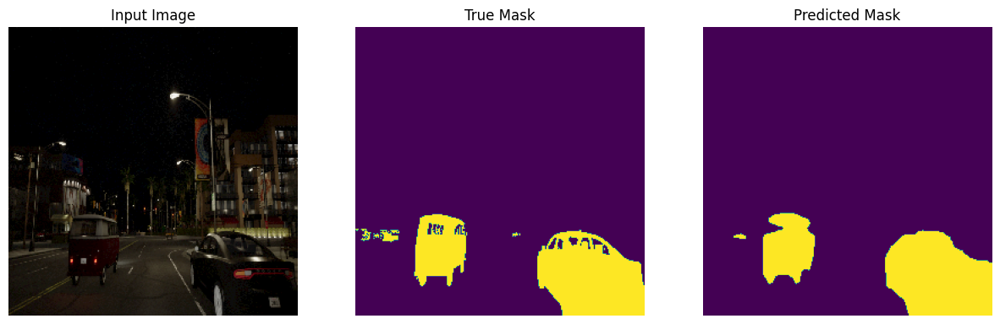

1/1 [==============================] - 0s 24ms/step


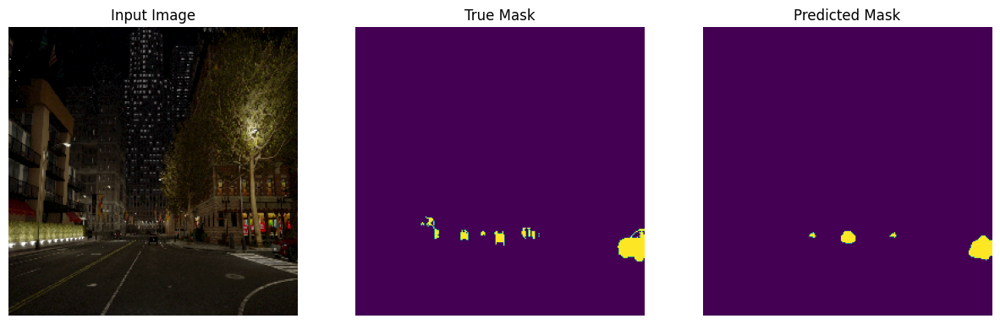

1/1 [==============================] - 0s 24ms/step


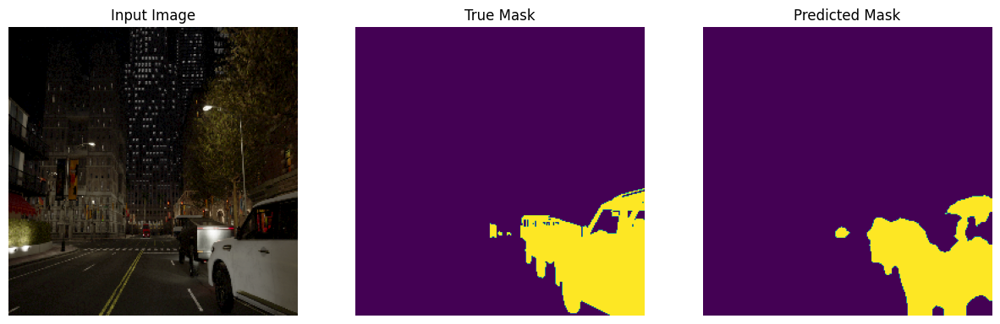

1/1 [==============================] - 0s 24ms/step


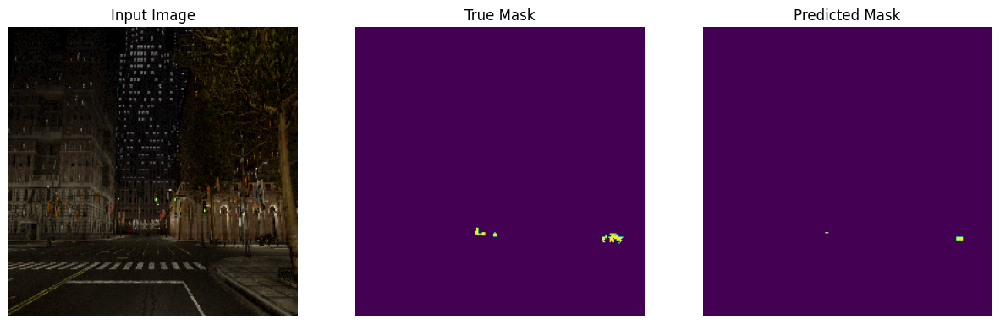

1/1 [==============================] - 0s 25ms/step


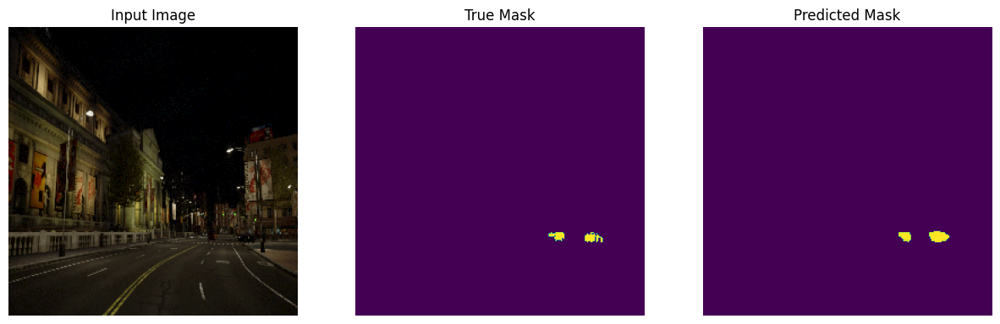

1/1 [==============================] - 0s 24ms/step


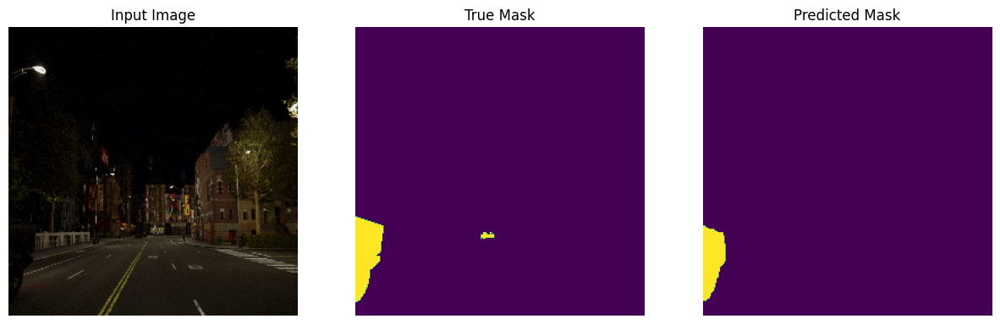

1/1 [==============================] - 0s 24ms/step


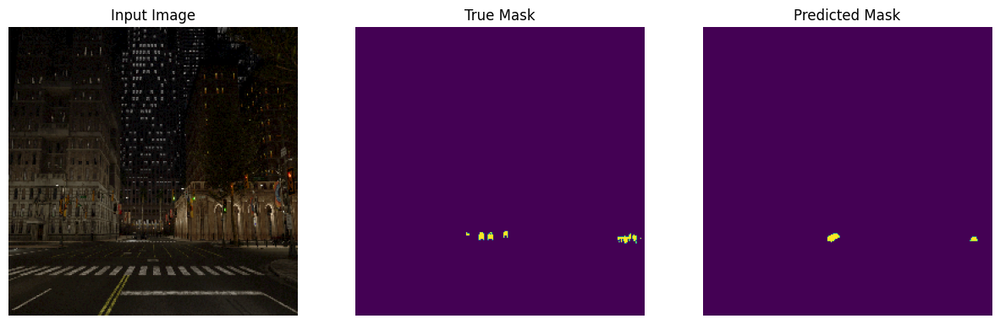

1/1 [==============================] - 0s 24ms/step


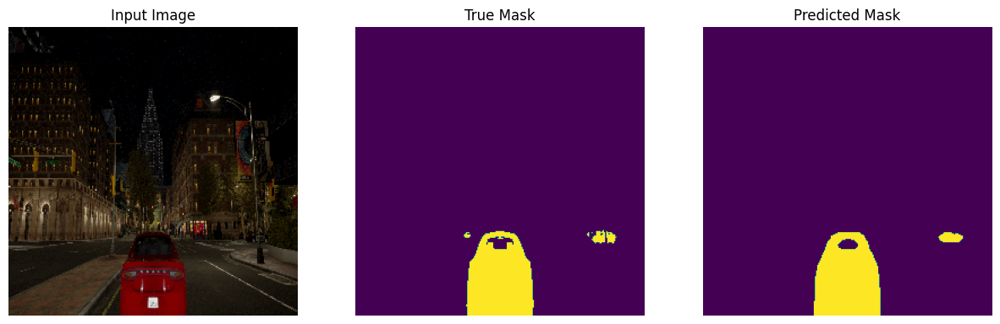

1/1 [==============================] - 0s 24ms/step


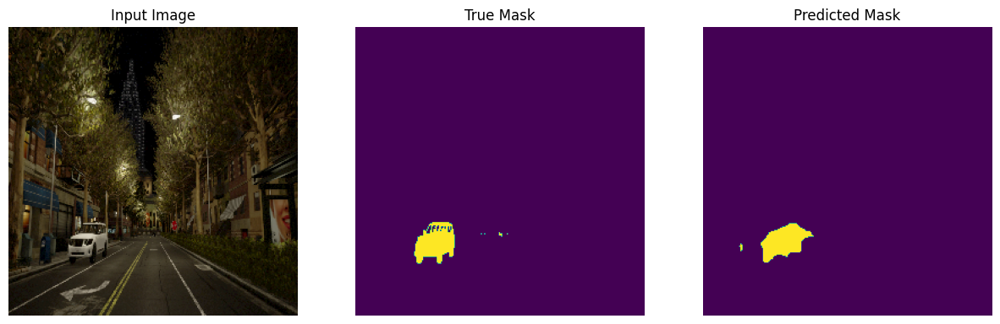

1/1 [==============================] - 0s 39ms/step


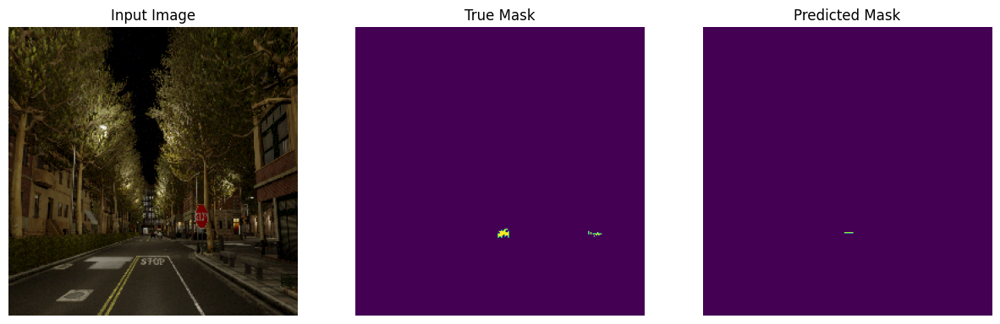

1/1 [==============================] - 0s 24ms/step


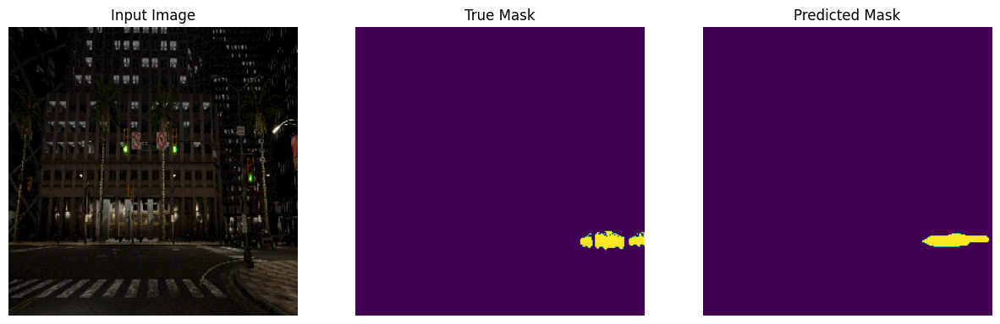

1/1 [==============================] - 0s 24ms/step


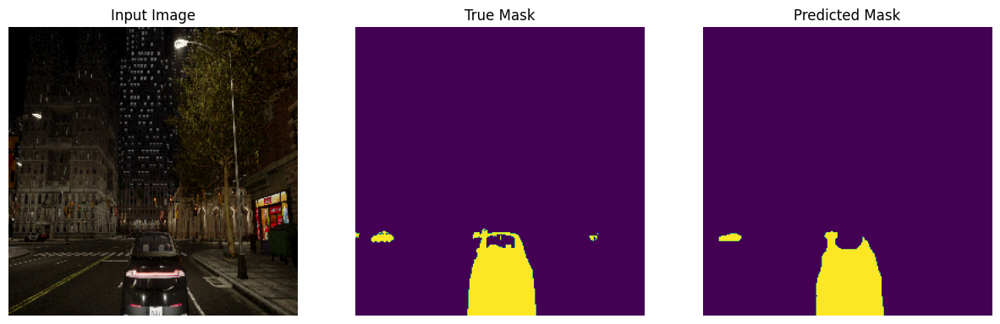

1/1 [==============================] - 0s 23ms/step


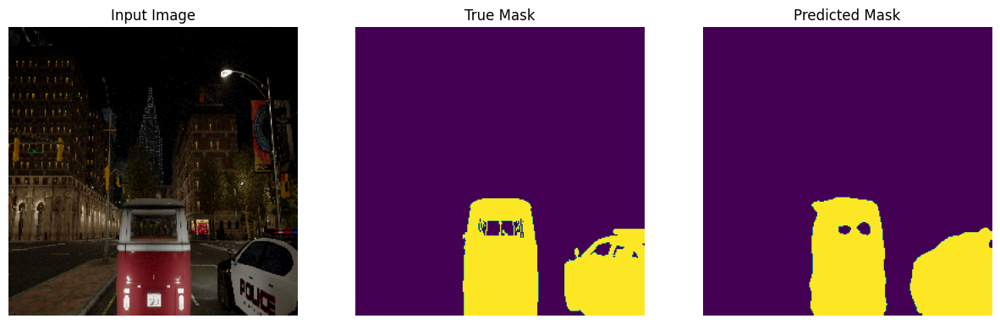

1/1 [==============================] - 0s 24ms/step


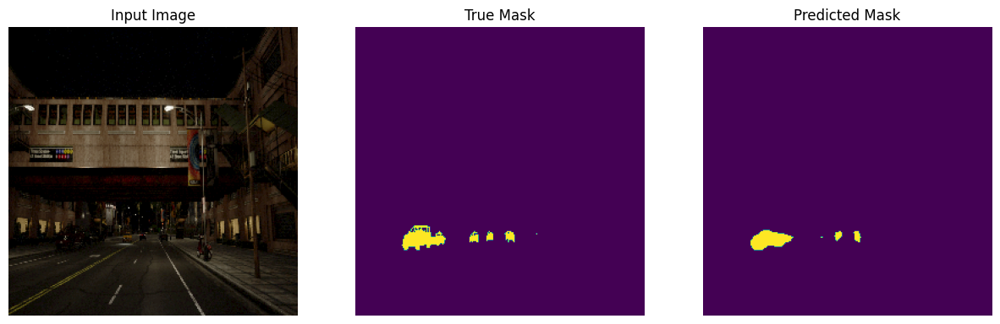

1/1 [==============================] - 0s 24ms/step


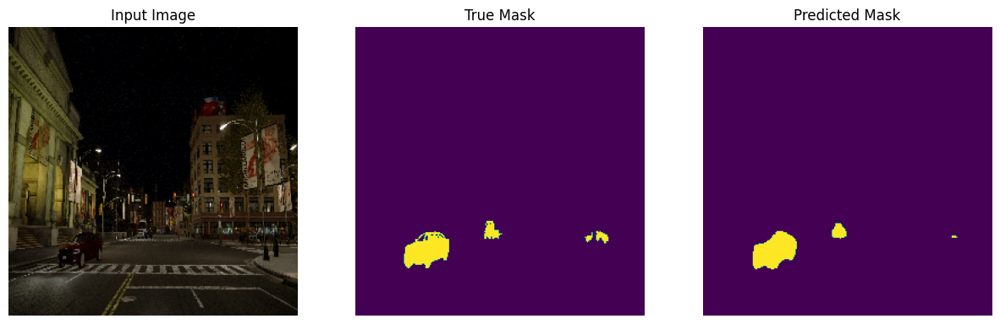

1/1 [==============================] - 0s 24ms/step


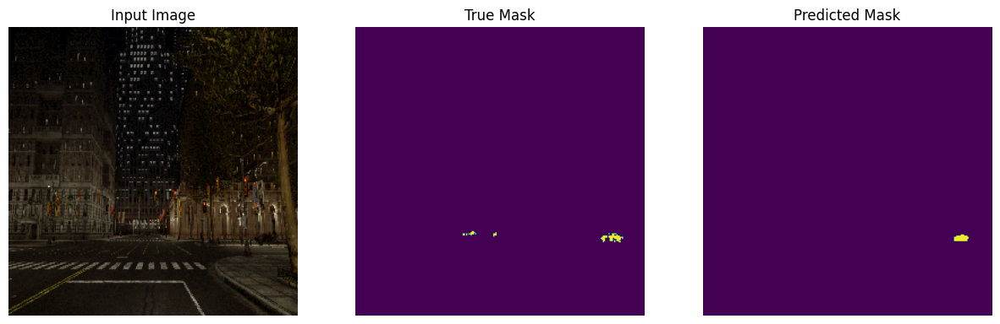

1/1 [==============================] - 0s 24ms/step


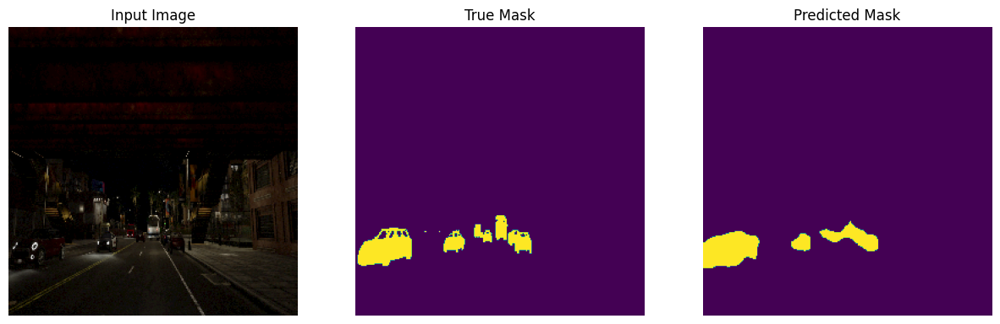

1/1 [==============================] - 0s 38ms/step


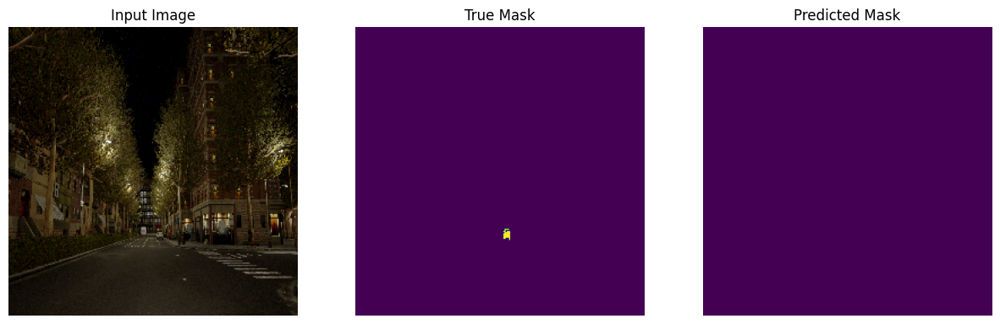

1/1 [==============================] - 0s 24ms/step


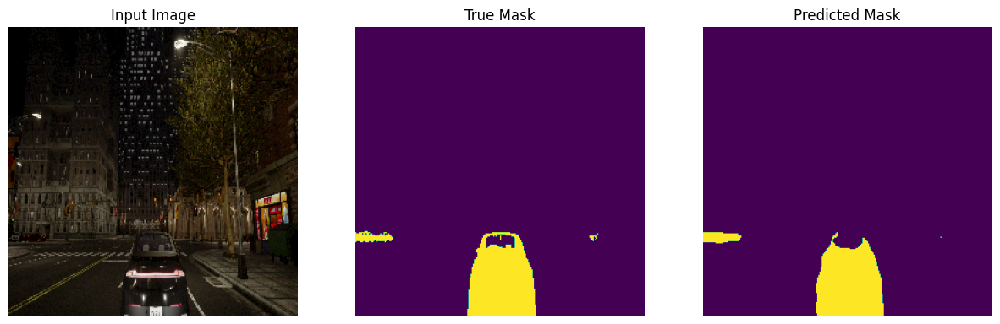

1/1 [==============================] - 0s 24ms/step


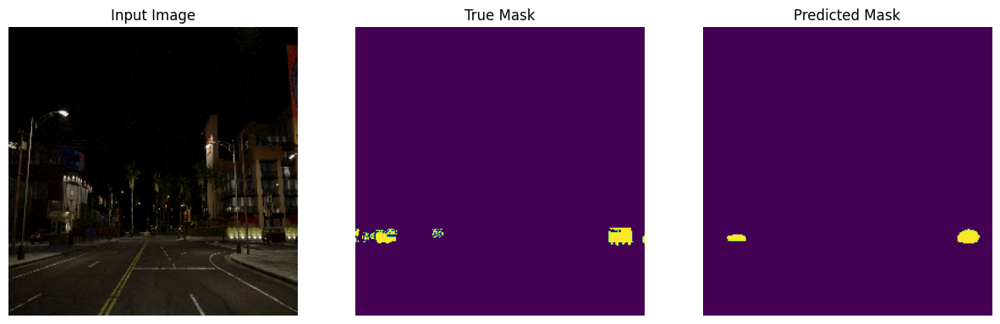

1/1 [==============================] - 0s 23ms/step


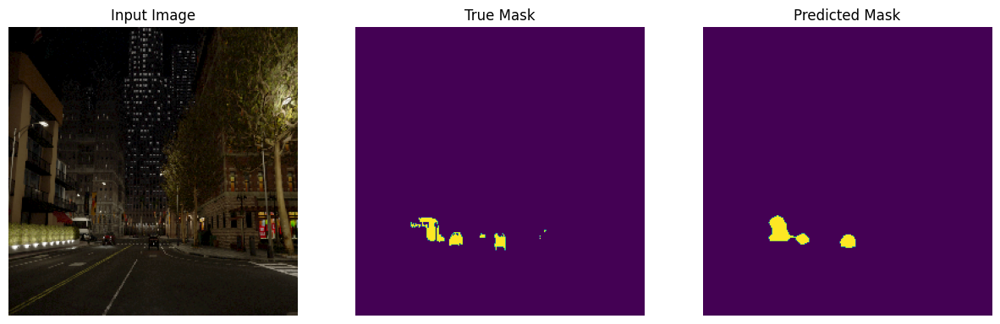

1/1 [==============================] - 0s 24ms/step


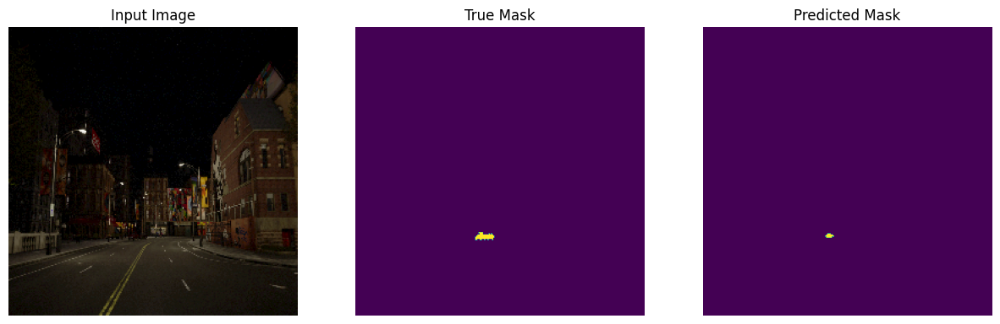

1/1 [==============================] - 0s 24ms/step


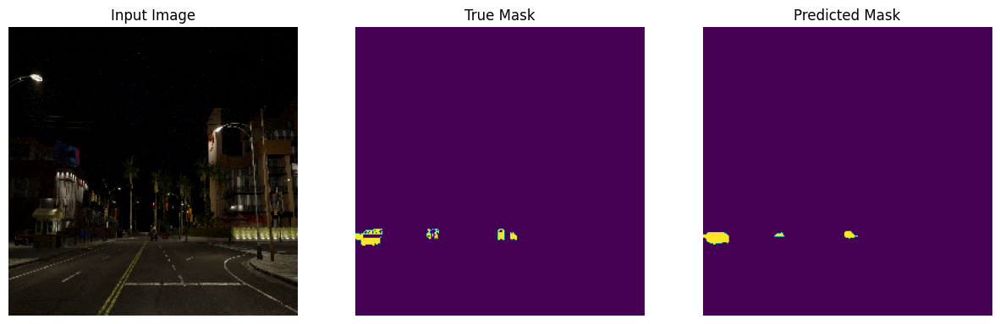

1/1 [==============================] - 0s 24ms/step


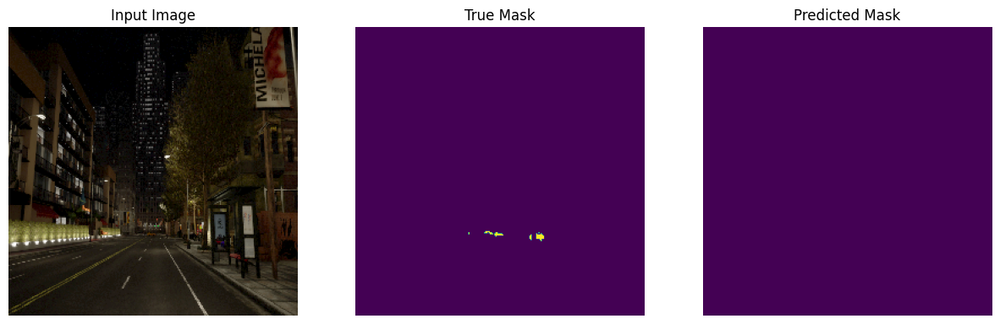

1/1 [==============================] - 0s 24ms/step


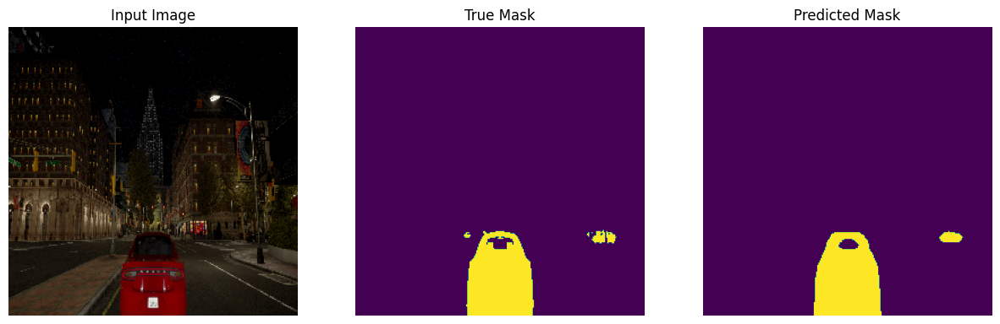

1/1 [==============================] - 0s 479ms/step


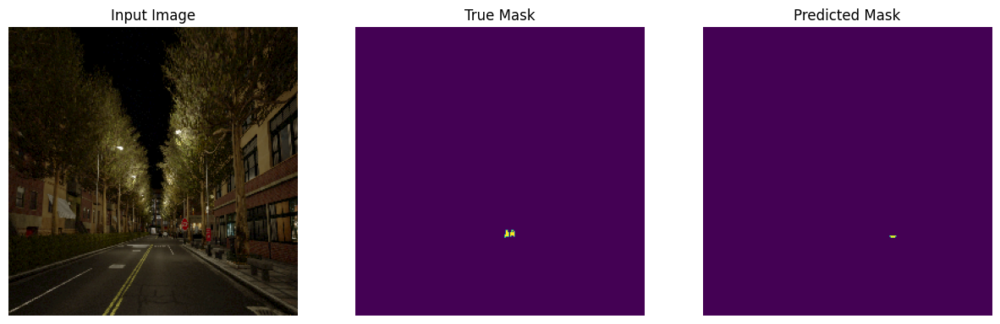

In [22]:
def show_predictions(dataset, num):
    """
    Displays the first image of each of the num batches
    """
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image)
            display([image[0], mask[0], create_mask(pred_mask)])
    else:
        display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

show_predictions(testDataset,100)